# Data Acquisition, Transformation, Exploration & Analysis

## Data Loading and Preparation

In [3]:
from dotenv import load_dotenv
import os
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec

In [15]:
load_dotenv()

API_KEY = os.getenv('API_KEY')

In [18]:
category_dict = {
    "MDM": "Durable Goods",
    "DXT": "Durable goods excluding transportation",
    "DXD": "Durable goods excluding defense",
    "MTU": "Manufacturing with unfilled orders",
    "31S": "Primary Metals",
    "32S": "Fabricated Metal Products",
    "33S": "Machinery",
    "34S": "Computers and Electronic Products",
    "CRP": "Computers and Related products",
    "34X": "Communications Equipment",
    "35S": "Electrical Equipment appliances and Components",
    "36S": "Transportation Equipment",
    "MVP": "Motor Vehicles and Parts",
    "NAP": "Nondefense Aircraft and Parts",
    "DAP": "Defense Aircraft and Parts",
    "ODG": "All Other Durable goods",
    "TCG": "Capital Goods",
    "NDE": "Nondefense Capital Goods",
    "NXA": "Nondefense Capital Goods Excluding Aircraft",
    "DEF": "Defense Capital Goods"
}
data_types_dict = {
    "VS": "Value of Shipments",
    "NO": "New Orders",
    "UO": "Unfilled Orders",
    "TI": "Total Inventories",
    "MPCVS": "Value of Shipments Percent Change Monthly",
    "MPCNO": "New Orders Percent Change Monthly",
    "MPCUO": "Unfilled Orders Percent Change Monthly",
    "MPCTI": "Total Inventories Percent Change Monthly"
}

In [19]:
def create_df(all_data):
    l = []
    columns = ['Time', 'Category', 'Seasonally_Adj', 'VS', 'NO', 'UO', 'TI', 'MPCVS', 'MPCNO', 'MPCUO', 'MPCTI']
    times = np.unique(all_data['time'])

    for time in times:
        for cat in category_dict:
            for adj in ['yes', 'no']:
                cur = [time, cat, adj]
                for dt in data_types_dict:
                    value = all_data[(all_data['time'] == time)  & (all_data['category_code'] == cat) & (all_data['seasonally_adj'] == adj) & (all_data['data_type_code'] == dt)]
                    if len(value) != 1:
                        print(f"No value at {time}, {cat}, {adj}, {dt}")
                        cur.append(np.nan)
                    else:
                        cur.append(value.iloc[0]['cell_value'])
                l.append(cur)
    return pd.DataFrame(l, columns=columns)

In [69]:
url = 'http://api.census.gov/data/timeseries/eits/advm3'
columns = ['Time', 'Category', 'Seasonally_Adj', 'VS', 'NO', 'UO', 'TI', 'MPCVS', 'MPCNO', 'MPCUO', 'MPCTI']

complete_data = pd.DataFrame(columns=columns)

for year in range(1992, 2024):
    params = {
        'get': 'category_code,cell_value,data_type_code,error_data,geo_level_code,program_code,seasonally_adj,time_slot_date,time_slot_id,time_slot_name',
        'for': 'us:*',
        'time': str(year),
        'key': API_KEY
    }

    response = requests.get(url, params=params)

    if response.status_code == 200:
        year_data = pd.DataFrame(response.json()[1:], columns=response.json()[0])
        complete_data = pd.concat([complete_data, create_df(year_data)], ignore_index=True)
    else:
        print(f"Failed to retrieve data for {year}: ", response.status_code)

No value at 1992-01, MDM, yes, NO
No value at 1992-01, MDM, yes, MPCVS
No value at 1992-01, MDM, yes, MPCNO
No value at 1992-01, MDM, yes, MPCUO
No value at 1992-01, MDM, yes, MPCTI
No value at 1992-01, MDM, no, NO
No value at 1992-01, MDM, no, MPCVS
No value at 1992-01, MDM, no, MPCNO
No value at 1992-01, MDM, no, MPCUO
No value at 1992-01, MDM, no, MPCTI
No value at 1992-01, DXT, yes, NO
No value at 1992-01, DXT, yes, MPCVS
No value at 1992-01, DXT, yes, MPCNO
No value at 1992-01, DXT, yes, MPCUO
No value at 1992-01, DXT, yes, MPCTI
No value at 1992-01, DXT, no, NO
No value at 1992-01, DXT, no, MPCVS
No value at 1992-01, DXT, no, MPCNO
No value at 1992-01, DXT, no, MPCUO
No value at 1992-01, DXT, no, MPCTI
No value at 1992-01, DXD, yes, NO
No value at 1992-01, DXD, yes, MPCVS
No value at 1992-01, DXD, yes, MPCNO
No value at 1992-01, DXD, yes, MPCUO
No value at 1992-01, DXD, yes, MPCTI
No value at 1992-01, DXD, no, NO
No value at 1992-01, DXD, no, MPCVS
No value at 1992-01, DXD, no, M

In [78]:
complete_data.head()

,Time,Category,Seasonally_Adj,VS,NO,UO,TI,MPCVS,MPCNO,MPCUO,MPCTI
0,1992-01,MDM,yes,117958,NaN,471297,242159,NaN,NaN,NaN,NaN
1,1992-01,MDM,no,106893,NaN,477445,239750,NaN,NaN,NaN,NaN
2,1992-01,DXT,yes,85783,NaN,194865,171640,NaN,NaN,NaN,NaN
3,1992-01,DXT,no,77279,NaN,197103,170139,NaN,NaN,NaN,NaN
4,1992-01,DXD,yes,108968,NaN,305561,211086,NaN,NaN,NaN,NaN


In [77]:
len(complete_data)

15280

Use the above data preparation method we have represented the initial `122000` rows of data into `15280` rows

In [79]:
complete_data.to_csv('q3_prepared.csv')

## Abbrevations

**MDM** =	Durable Goods

**DXT** =	Durable goods excluding transportation

**DXD** =	Durable goods excluding defense

**MTU** =	Manufacturing with unfilled orders

**31S** =	Primary Metals

**32S** =	Fabricated Metal Products

**33S** =	Machinery

**34S** =	Computers and Electronic Products

**CRP** =	Computers and Related products

**34X** =	Communications Equipment

**35S** =	Electrical Equipment appliances and Components

**36S** =	Transportation Equipment

**MVP** =	Motor Vehicles and Parts

**NAP** =	Nondefense Aircraft and Parts

**DAP** =	Defense Aircraft and Parts

**ODG** =	All Other Durable goods

**TCG** =	Capital Goods

**NDE** =	Nondefense Capital Goods

**NXA** =	Nondefense Capital Goods Excluding Aircraft

**DEF** =	Defense Capital Goods

**VS** =	Value of Shipments

**NO** =	New Orders

**UO** =	Unfilled Orders

**TI** =	Total Inventories

**MPCVS** = 	Value of Shipments Percent Change Monthly

**MPCNO** = 	New Orders Percent Change Monthly

**MPCUO** = 	Unfilled Orders Percent Change Monthly

**MPCTI** = 	Total Inventories Percent Change Monthly

# Visualization and Analysis

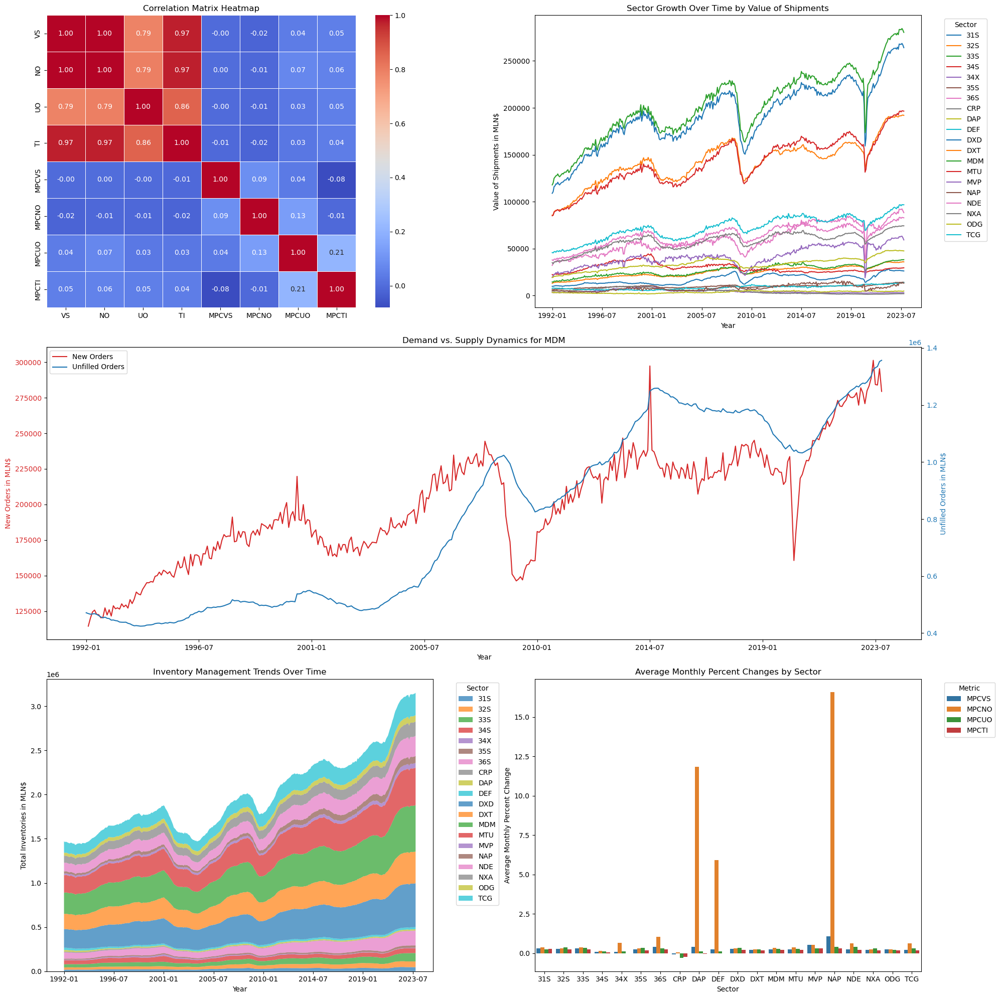

**Value Statement:** The categories including the durable goods, metals, manufacturing, transportation, nondefense capital goods reveals an industry that is not only resilient in the face of global economic disturbances but also adept at post-recession recoveries to achieve long-term growth. Despite the demand-supply imbalances in 34S, NAP, DAP and DEF, the overall industry exhibits a strong correlation between supply chain activities, indicating effective inventory and production management that aligns with fluctuating demand. The downward trends in CRP and 34X, contrasted with the general industry growth, calling attention to the impact of technological evolutions and consumer trends on industry performance.


The categories MDM, DXT, DXD, MTU, 31S, 32S, 33S, 35S, 36S, MVP, ODG, TCG, NDE, NXA demonstrate a capacity for recovery. Long-term trends of these categories show consistent growth across most sectors, with shipments (VS) and new orders (NO) exhibiting upward trajectories. These sectors despite its unique challenges and market dynamics, has demonstrated an ability to recover from economic downturns, particularly the 2008 recession and COVID-19, and align its production and supply chain strategies to meet evolving market demands. Rising unfilled orders in categories like 34S, NAP, DAP and DEF highlight a demand that often outpaces current production capabilities, suggesting potential areas for efficiency improvements or capacity expansion. The categories CRP, 34X has seen a consistent downward trend with the decrease in shipments and new orders equivalently decreasing the inventory over time. In the CRP, 34X, 35S categories market saturation, technological shifts, and consumer preferences play significant roles in shaping industry trends.


Steady increases in total inventories across several categories indicate strategic stockpiling, possibly as a proactive measure against supply chain disruptions or in anticipation of future demand surges because of the category's upward trend. Monthly percent changes demonstrate quick adaptation to market trends, technological advancements, and economic conditions, marked by significant volatility. High correlations between level metrics (VS, NO, UO, TI) reflect the interconnected nature of the supply chain. As orders increase, companies typically boost production, which in turn increases shipments and inventories. The lower correlations between the monthly percent changes and the level metrics indicate that short-term fluctuations in these rates of change are less predictable and do not have a consistent relationship with the overall levels of the other metrics. Correlations among monthly percent changes are also generally low, which may be due to the fact that these changes are influenced by more volatile short-term factors, while the level metrics (VS, NO, UO, TI) are more likely to be influenced by long-term trends and strategic business decisions.

# EDA Results

**(Please find the EDA step by step code at the end of the notebook)**

## Category Analysis

### MDM (Durable Goods)

The 'MDM' category exhibits high volatility in its monthly data, reflecting immediate responses to economic events and market conditions. However, quarterly data shows a smoother trend, revealing consistent growth in shipments (VS) and orders (NO), indicative of steady demand. Yearly trends confirm long-term growth, marked by a clear upward trajectory and well-managed inventory increases, evidencing effective supply chain management.

### DXT (Durable goods excluding transportation)

For the 'DXT' category, monthly data reveals an upward trend with notable fluctuations, especially a significant decline during the 2008 recession, after which a recovery is observed. New orders generally increase over time but dip during economic slumps. Unfilled orders grow, suggesting demand variability and production adjustments, while inventories steadily rise, possibly in response to expected future demand. Unfilled orders' growth in quarterly data suggests a lag in supply meeting demand, while inventory accumulation may be strategic.


### DXD (Durable goods excluding defense)

The 'DXD' sector, representing durable goods excluding defense, shows sustained growth and resilience, particularly recovering after the 2008 recession. The consistent rise in new orders and value of shipments indicates stable demand. Increasing unfilled orders suggest a challenge in meeting demand. Steadily climbing inventories may reflect anticipation of future demand increases. Monthly percent changes display the stability in the rate of change for unfilled orders and inventories points to a balanced month-to-month dynamic.

### MTU (Manufacturing with unfilled orders)

In the 'MTU' category there's a consistent increase in value of shipments over the years, though periods of stagnation and slight decline hint at market fluctuations or economic impacts. New orders show growth with peaks and troughs, likely mirroring economic cycles or the impact of large-scale orders. Unfilled orders are on an upward trajectory, suggesting either a rise in demand outpacing production or slower manufacturing processes. Inventory levels steadily grow, possibly indicating effective demand forecasting or proactive stock accumulation for anticipated sales.

### 31S (Primary Metals)

In the '31S' category, representing Primary Metals, the trends across various timeframes reveal a dynamic and growing industry. Value of Shipments (VS) demonstrates an overall increasing trend, punctuated by notable peaks, especially around 2008, and a recent surge since 2016. New Orders (NO) reflects a similar upward trajectory to shipments, indicating consistent demand in the primary metals sector. Unfilled Orders (UO) shows a significant spike around 2008, hinting at a sudden surge in demand or supply chain disruptions.

### 32S (Fabricated Metal Products)

In the '32S' category for Fabricated Metal Products show a general upward trend in Value of Shipments (VS) and New Orders (NO), with noticeable recoveries post-economic downturns. Unfilled Orders (UO) have significantly increased since 2009, indicating either higher demand or extended production cycles. Quarterly UO display a more pronounced upward trend, underscoring a steady increase in production demand.

### 33S (Machinery)

In the '33S' Machinery category, the analysis of time series data reveals a sector experiencing long-term growth but susceptible to economic fluctuations. Both Value of Shipments (VS) and New Orders (NO) show an overall upward trend. Unfilled Orders (UO) have consistently increased, indicating a strong, growing demand not immediately met by supply, likely due to the complexity of machinery production or increased market demand. Total Inventories (TI) have also seen substantial growth.

### 34S (Computers and Electronic Products)
In the '34S' category for Computers and Electronic Products, the time series data reveals significant industry shifts influenced by market demands and technological advancements. The Value of Shipments (VS) and New Orders (NO) experienced a peak around the 2000 dot-com bubble, followed by a decline and gradual recovery with fluctuations. Unfilled Orders (UO) displayed considerable volatility, peaking sharply around 2000 and 2010, then stabilizing with a slight decline, potentially reflecting improved demand fulfillment or altered order patterns. Total Inventories (TI) have generally increased, with a notable decrease around the 2000s before rising again. Percent change metrics like MPCVS, MPCNO, MPCUO, and MPCTI show substantial volatility, reflecting the rapidly changing nature of consumer and business demand in this sector.

### CRP (Computers and Related products)

In the 'CRP' category for Computers and Related Products, Value of Shipments (VS) and New Orders (NO) peaked around 2000, followed by a decline and subsequent stabilization. Unfilled Orders (UO) also peaked in the early 2000s, then declined. Total Inventories (TI) peaked slightly later, reflecting a lag in adjusting to the market decline.

### 34X (Communications Equipment)
In the '34X' category, focusing on Communications Equipment, both Value of Shipments (VS) and New Orders (NO) peaked around 2000, followed by a decline to a stable but lower level, mirroring the broader tech sector's trajectory post-dot-com bubble. Unfilled Orders (UO) and Total Inventories (TI) exhibited similar patterns, with unfilled orders peaking in the early 2000s and inventories peaking slightly later, all following the same downward and stabilizing trend.


### 35S (Electrical Equipment appliances and Components)

In the 35S category, the monthly trends reveal a positive trajectory in various economic indicators. The Value of Shipments (VS) and New Orders (NO) exhibit a consistent upward movement over time, albeit with occasional fluctuations, suggesting a general growth pattern in the sector. Unfilled Orders (UO) show a pronounced upward trend, particularly from around 2010 onwards, implying a surge in demand that potentially surpasses current production capacity. Total Inventories (TI) also demonstrate an increasing trend, which could signify improved inventory management practices or anticipation of heightened demand. 

### 36S (Transportation Equipment)

In the 36S category, the Value of Shipments (VS) shows a steady increase until around 2015, followed by a plateau, which could indicate market saturation or stabilization. New Orders (NO) reflects a similar pattern to VS, with growth followed by stabilization. Unfilled Orders (UO) has a significant increase over time, reflecting a robust backlog of orders.


### MVP (Motor Vehicles and Parts)

In the MVP category, the Value of Shipments (VS) demonstrates growth with notable drops, possibly linked to economic downturns. New Orders (NO) follows a similar trend. Unfilled Orders (UO) shows stability with some peaks, possibly reflecting model changeovers or market demand shifts. Inventory levels rise steadily.

### NAP (Nondefense Aircraft and Parts)

In the NAP category the value of shipments (VS) exhibits an overall upward trajectory with intermittent declines, notably around 2001 and during the 2008-2009 global financial crisis, followed by a sustained recovery. New orders (NO) display a more volatile pattern, marked by significant spikes in 2001 and 2019-2021, suggesting periods of substantial orders. The general trend seems to be flat to slightly increasing over time, with periodic surges in new orders. Unfilled orders exhibit a long-term increasing trend, suggesting that production is lagging behind orders, or that the industry is securing long-term contracts. There is a significant increase around the 2006-2008 period, followed by a plateau and a steep rise after 2010. Total inventories (TI) steadily increase.

### DAP (Defense Aircraft and Parts)

In the DAP category the value of shipments (VS) shows less volatility compared to NAP, likely reflecting the more stable nature of defense contracts. New orders are erratic, with sharp increases and decreases, which may reflect the timing of government defense contracts. There is a trend of increasing unfilled orders, possibly due to the long lead times associated with defense contracts. The inventory levels show a general increase with some fluctuations, which could indicate inventory management in response to expected orders. The monthly percent changes are sporadic, with occasional spikes that could correspond to specific contract fulfillments or new orders.


### ODG (All Other Durable goods)

In the ODG category the value of shipments (VS) shows a steady upward trend, indicating general growth in this sector. New orders appear to be increasing over time, suggesting a steady demand for ODG. There's a noticeable growth in unfilled orders, which may indicate an increasing demand that surpasses the current supply capacity. Inventories have been rising, which could be due to an imbalance between production and sales.


### TCG (Capital Goods)

In the TCG category the Value of Shipments (VS) shows consistent growth with periodic fluctuations, likely responding to market demands or production schedules. New Orders (NO) exhibit significant spikes, indicating intermittent large-scale orders and an overall upward trajectory, signifying increased demand for capital goods. Unfilled Orders (UO) demonstrate a persistent upward trend, implying a growing backlog and potential challenges in aligning production with demand. Total Inventories (TI) gradually increase with some variability. 

### NDE (Nondefense Capital Goods)

In the NDE the Value of Shipments (VS) demonstrates a general upward trajectory, with notable declines around the 2008-2009 global financial crisis and a recent sharp increase. New Orders (NO) and Unfilled Orders (UO) also exhibit overall growth, with spikes in 2014 suggesting periods of heightened demand or large contracts. Total Inventories (TI) show a steady increase, indicative of effective stock management or expanded production capacity.


### NXA (Nondefense Capital Goods Excluding Aircraft)

In the NXA category the Value of Shipments (VS) demonstrates an overall upward trajectory with fluctuations, and recent indications of increased shipments. New Orders (NO) also exhibit an upward trend with intermittent declines, including the early 2000s and a recent recovery. Unfilled Orders (UO) show a gradual increase, indicating growing demand, particularly visible in yearly data with smoother trends. Total Inventories (TI) steadily increase without sharp spikes, suggesting controlled growth aligned with overall production and shipments.

### DEF (Defense Capital Goods)

In the DEF category the Value of Shipments (VS) exhibits a steady upward trajectory, especially evident in yearly data, indicating consistent demand for defense capital goods. Recent upticks in monthly and quarterly data suggest a potential increase in defense spending or fulfillment of substantial contracts. New Orders (NO) display high volatility with sporadic spikes, likely associated with specific government defense contracts. Unfilled Orders (UO) have increased over time, signaling potential challenges in meeting demand or long lead times typical for defense contracts. Total Inventories (TI) show an upward trend (depsite the initial decrease), reflecting anticipation of future orders or materials accumulation for expected production needs.

## High Correlations
- **VS (Value of Shipments) and NO (New Orders)**: The strong positive correlation (close to 1) suggests that as new orders increase, the value of shipments also increases. This is expected since more orders typically lead to more shipments if production capacity can keep up with the orders.
- **VS (Value of Shipments) and TI (Total Inventories)**: The high positive correlation indicates that when the value of shipments is high, the total inventories are also high. This could be because as companies ship more products, they also produce more, thus increasing their inventories.
- **NO (New Orders) and TI (Total Inventories)**: This similarly high correlation suggests that new orders are closely linked with total inventories, reinforcing the idea that a demand increase (more orders) often leads to more inventory being held, possibly as a buffer or in anticipation of future orders.
- **UO (Unfilled Orders) and TI (Total Inventories)**: The correlation here is also positive and high, indicating that as unfilled orders accumulate, inventories also tend to be higher, which could be due to production not keeping pace with orders, leading to both increased backlogs and inventory levels.

## Interpreting Demand Vs Supply Dynamics
- If both NO and UO lines follow a similar pattern or direction (both increasing or decreasing), it suggests that the supply chain is responding proportionally to demand changes.
- If the lines diverge (one rises as the other falls or remains stable), it may indicate an imbalance. For instance, if NO increases while UO decreases, the sector might be efficiently meeting increased demand.
- A decreasing gap between NO and UO might suggest improving efficiency in fulfilling orders or an increase in production capacity.
- An increasing gap can indicate growing demand that outpaces production capacity, possibly leading to longer lead times and increased backlogs.
- Sharp spikes or dips in either metric can signify external impacts (e.g., economic events, policy changes, technological advancements) or internal changes (e.g., production innovations, capacity changes).

# EDA Code

In [4]:
complete_data = pd.read_csv('q3_prepared.csv', index_col=0)

In [5]:
complete_data.head()

,Time,Category,Seasonally_Adj,VS,NO,UO,TI,MPCVS,MPCNO,MPCUO,MPCTI
0,1992-01,MDM,yes,117958,NaN,471297,242159,NaN,NaN,NaN,NaN
1,1992-01,MDM,no,106893,NaN,477445,239750,NaN,NaN,NaN,NaN
2,1992-01,DXT,yes,85783,NaN,194865,171640,NaN,NaN,NaN,NaN
3,1992-01,DXT,no,77279,NaN,197103,170139,NaN,NaN,NaN,NaN
4,1992-01,DXD,yes,108968,NaN,305561,211086,NaN,NaN,NaN,NaN


In [6]:
complete_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15280 entries, 0 to 15279
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Time            15280 non-null  object 
 1   Category        15280 non-null  object 
 2   Seasonally_Adj  15280 non-null  object 
 3   VS              15280 non-null  int64  
 4   NO              15240 non-null  float64
 5   UO              15280 non-null  int64  
 6   TI              15280 non-null  int64  
 7   MPCVS           15240 non-null  float64
 8   MPCNO           15200 non-null  float64
 9   MPCUO           15240 non-null  float64
 10  MPCTI           15240 non-null  float64
dtypes: float64(5), int64(3), object(3)
memory usage: 1.4+ MB


## NULL Values

NO - Does not have values for the month 1992-01

MPCVS, MPCNO, MPCUO, MPCTI - Have NULL Values in 1992-01 because it is the initial month

MPCNO - Have NULL values for 1992-02 because there are no NO values for the previous month 1992-01

## Variable Analysis

In [12]:
complete_data['Time'] = pd.to_datetime(complete_data['Time']).dt.to_period('M')

In [7]:
complete_data[:10]

,Time,Category,Seasonally_Adj,VS,NO,UO,TI,MPCVS,MPCNO,MPCUO,MPCTI
0,1992-01,MDM,yes,117958,NaN,471297,242159,NaN,NaN,NaN,NaN
1,1992-01,MDM,no,106893,NaN,477445,239750,NaN,NaN,NaN,NaN
2,1992-01,DXT,yes,85783,NaN,194865,171640,NaN,NaN,NaN,NaN
3,1992-01,DXT,no,77279,NaN,197103,170139,NaN,NaN,NaN,NaN
4,1992-01,DXD,yes,108968,NaN,305561,211086,NaN,NaN,NaN,NaN
5,1992-01,DXD,no,99535,NaN,308374,209206,NaN,NaN,NaN,NaN
6,1992-01,MTU,yes,85081,NaN,471297,198103,NaN,NaN,NaN,NaN
7,1992-01,MTU,no,76624,NaN,477445,195857,NaN,NaN,NaN,NaN
8,1992-01,31S,yes,9924,NaN,17998,16961,NaN,NaN,NaN,NaN
9,1992-01,31S,no,9767,NaN,18224,16953,NaN,NaN,NaN,NaN


**Filtering the Seasonally Adjusted Data**

In [8]:
complete_sesonally_adj = complete_data[complete_data['Seasonally_Adj'] == 'yes']
complete_sesonally_adj

,Time,Category,Seasonally_Adj,VS,NO,UO,TI,MPCVS,MPCNO,MPCUO,MPCTI
0,1992-01,MDM,yes,117958,NaN,471297,242159,NaN,NaN,NaN,NaN
2,1992-01,DXT,yes,85783,NaN,194865,171640,NaN,NaN,NaN,NaN
4,1992-01,DXD,yes,108968,NaN,305561,211086,NaN,NaN,NaN,NaN
6,1992-01,MTU,yes,85081,NaN,471297,198103,NaN,NaN,NaN,NaN
8,1992-01,31S,yes,9924,NaN,17998,16961,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
15270,2023-10,ODG,yes,47633,47609.0,12517,71495,-0.2,-0.1,-0.2,0.2
15272,2023-10,TCG,yes,96786,100898.0,1012959,251472,0.0,-11.2,0.4,0.3
15274,2023-10,NDE,yes,82894,85254.0,800692,227279,-0.3,-15.6,0.3,0.3
15276,2023-10,NXA,yes,74351,73794.0,270416,163018,0.0,-0.1,-0.2,0.1


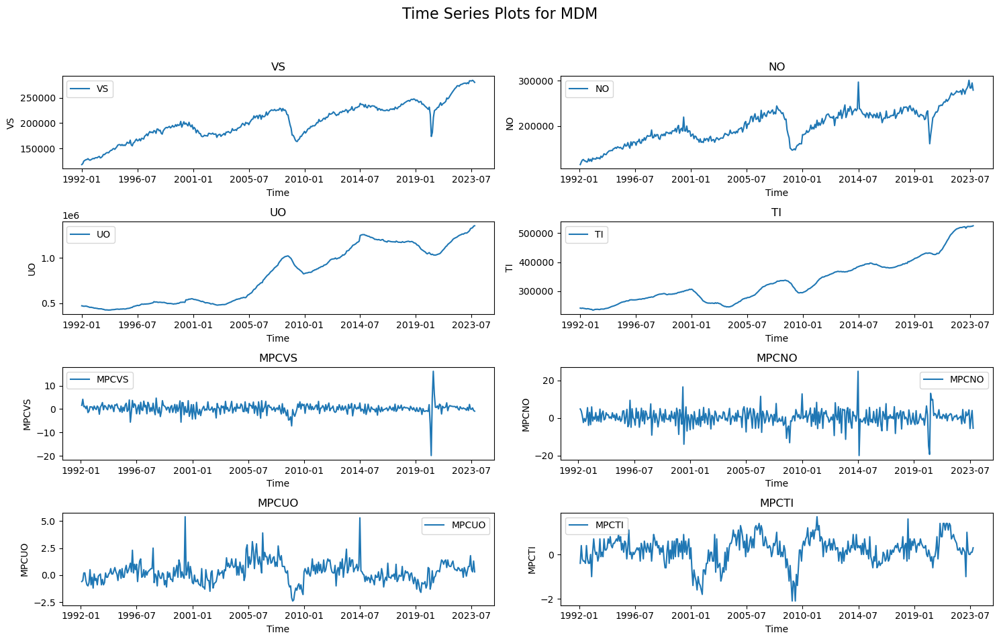

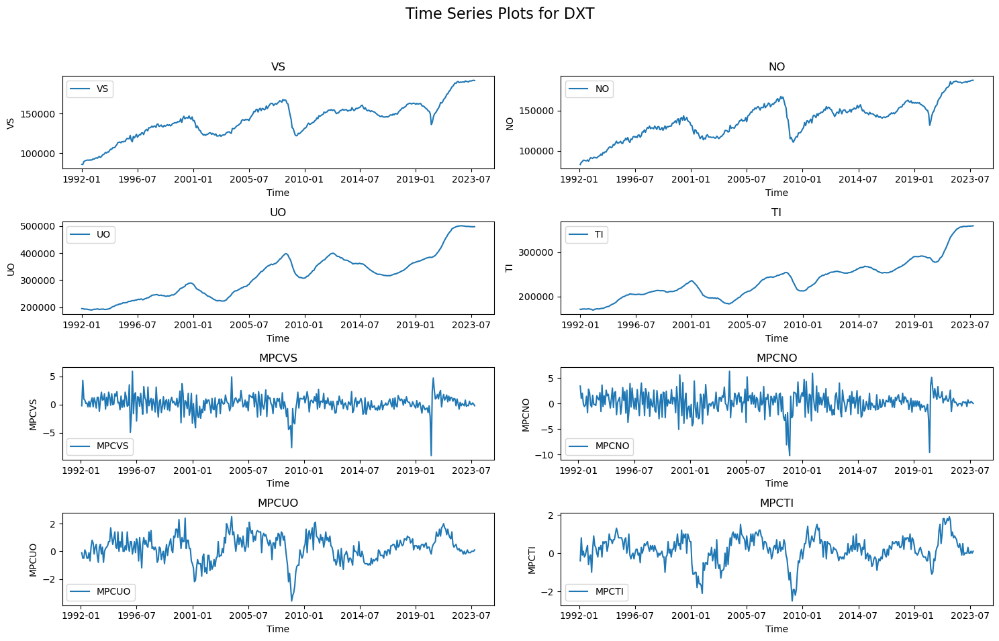

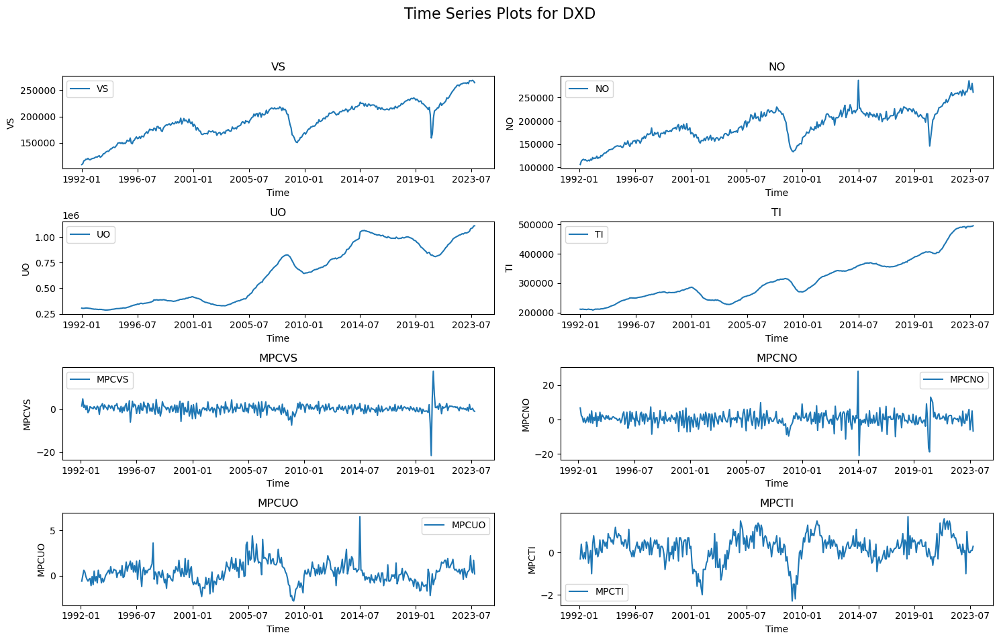

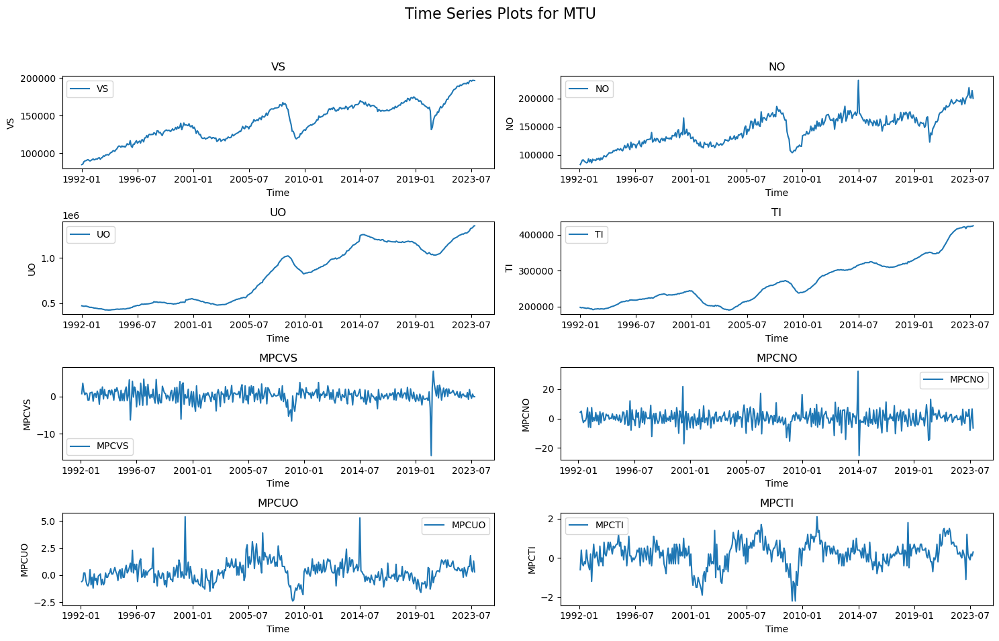

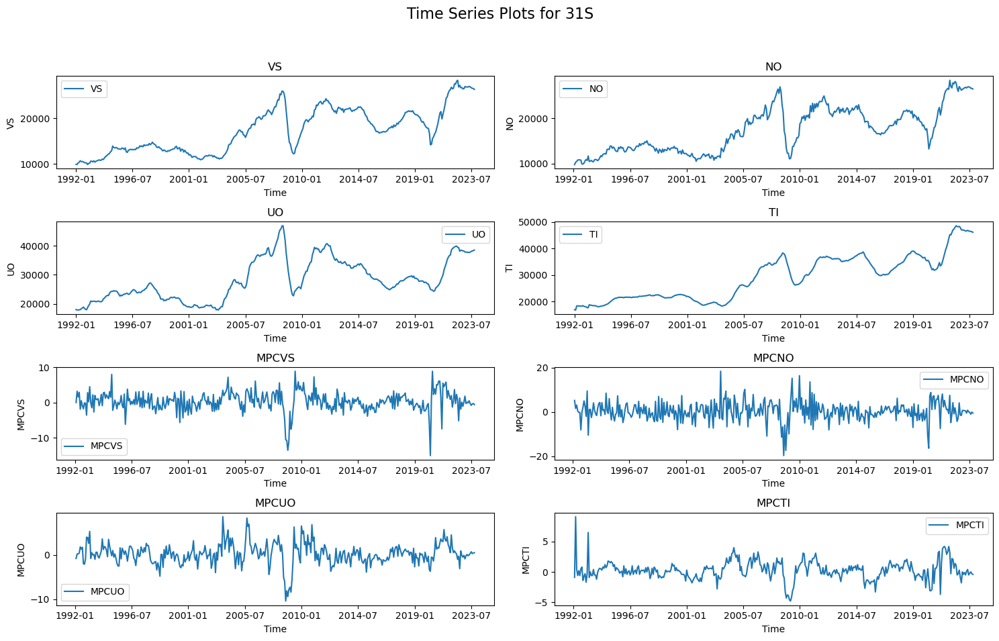

...

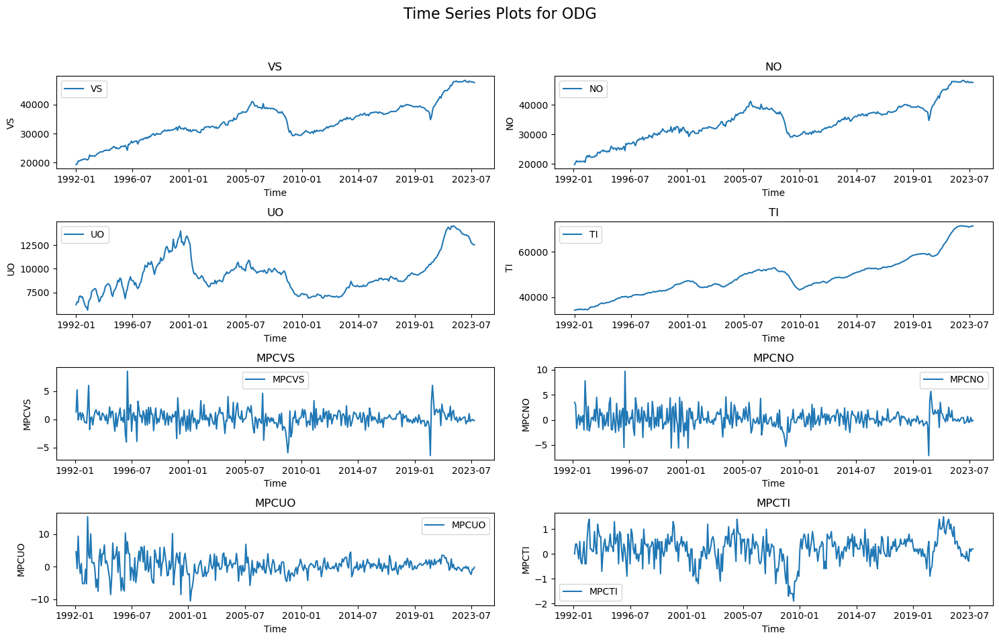

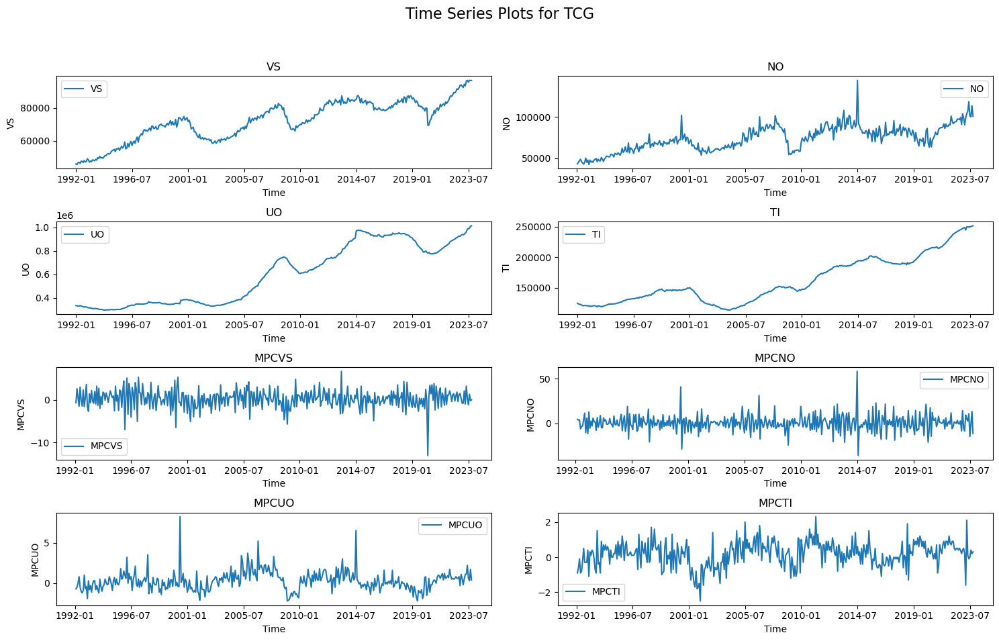

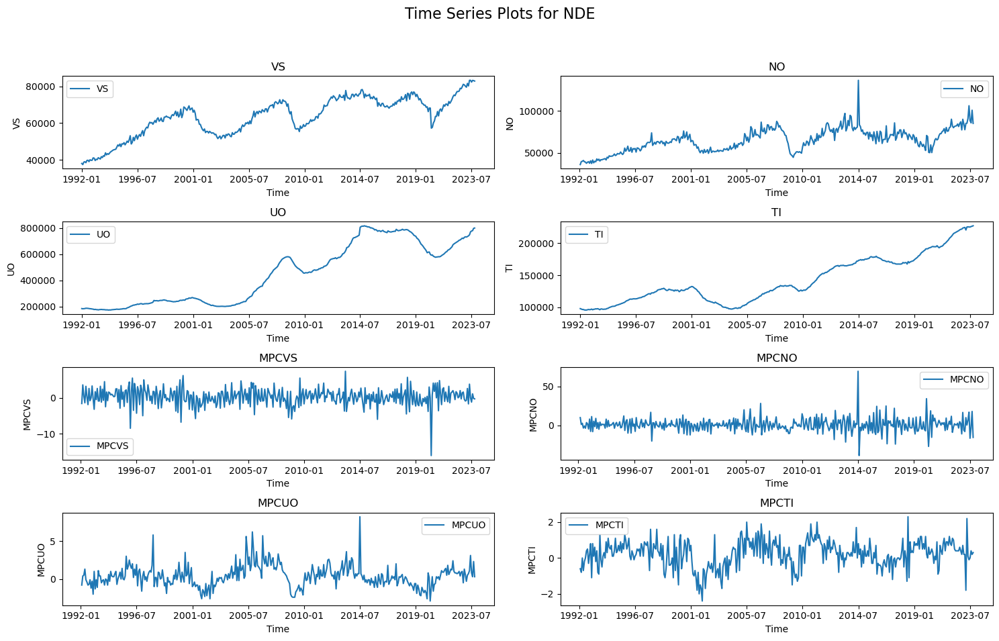

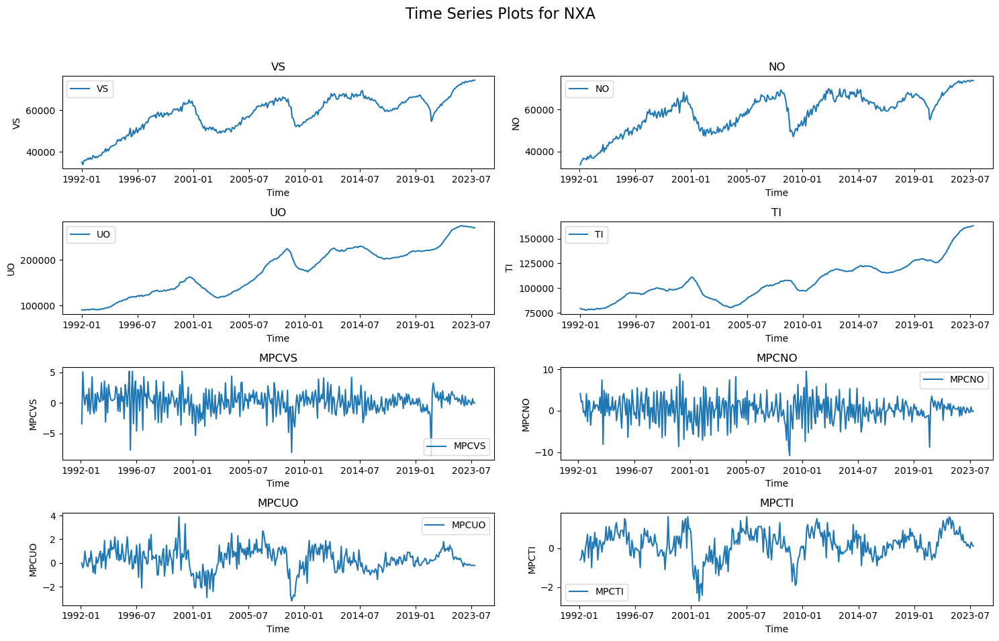

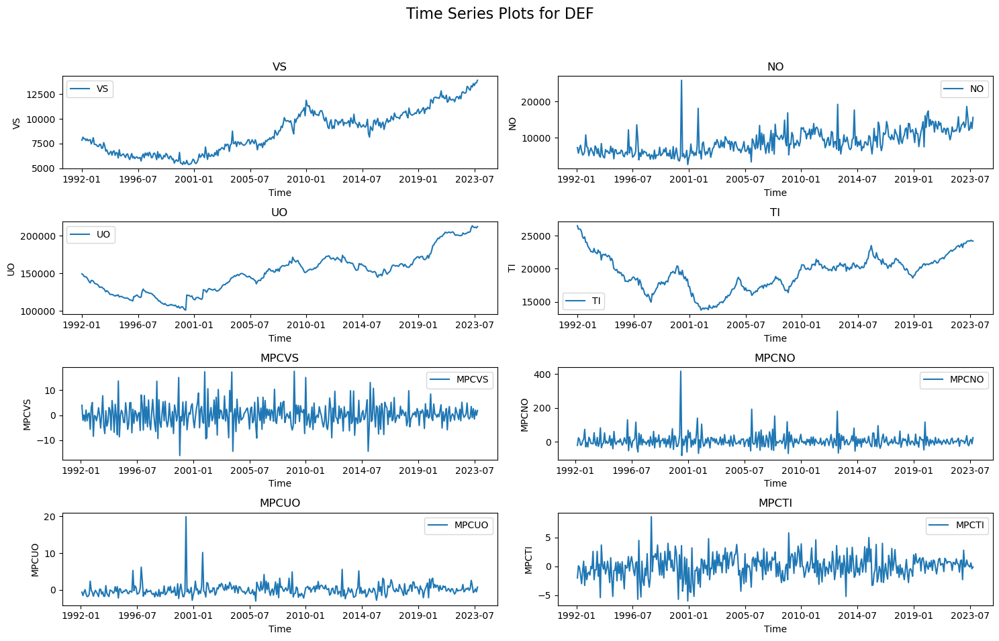

In [9]:
columns_to_plot = ['VS', 'NO', 'UO', 'TI', 'MPCVS', 'MPCNO', 'MPCUO', 'MPCTI']

categories = complete_sesonally_adj['Category'].unique()

for category in categories:
    category_data = complete_sesonally_adj[complete_sesonally_adj['Category'] == category]
    
    plt.figure(figsize=(15, 10))
    plt.suptitle(f'Time Series Plots for {category}', fontsize=16)
    
    for i, column in enumerate(columns_to_plot, 1):
        plt.subplot(4, 2, i)
        plt.plot(category_data['Time'].astype(str), category_data[column], label=column)
        plt.title(column)
        plt.xlabel('Time')
        plt.ylabel(column)
        plt.legend()
        num_ticks = 7
        plt.xticks(plt.xticks()[0][::len(plt.xticks()[0]) // num_ticks])
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


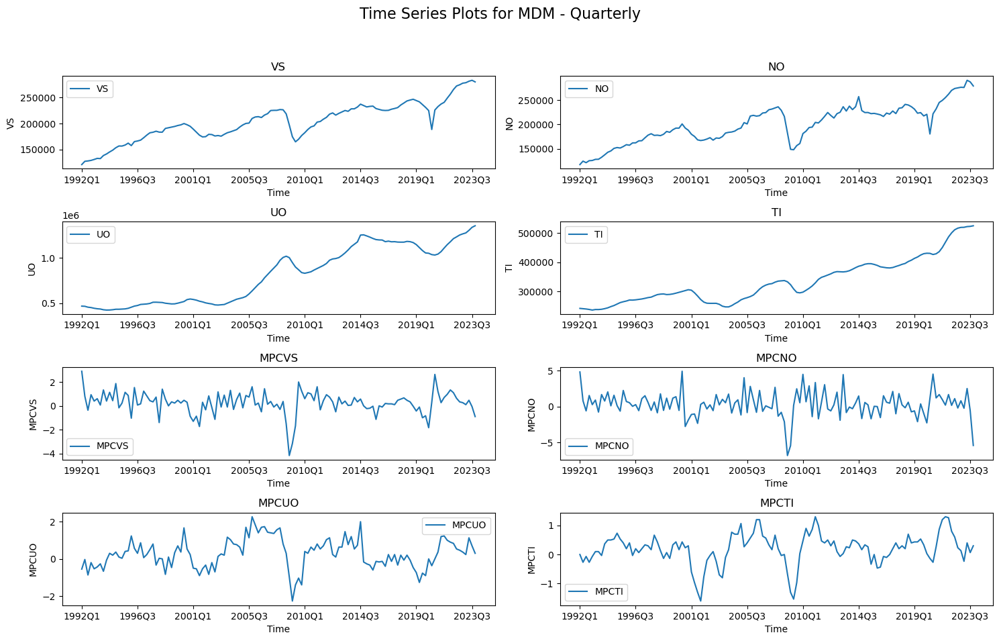

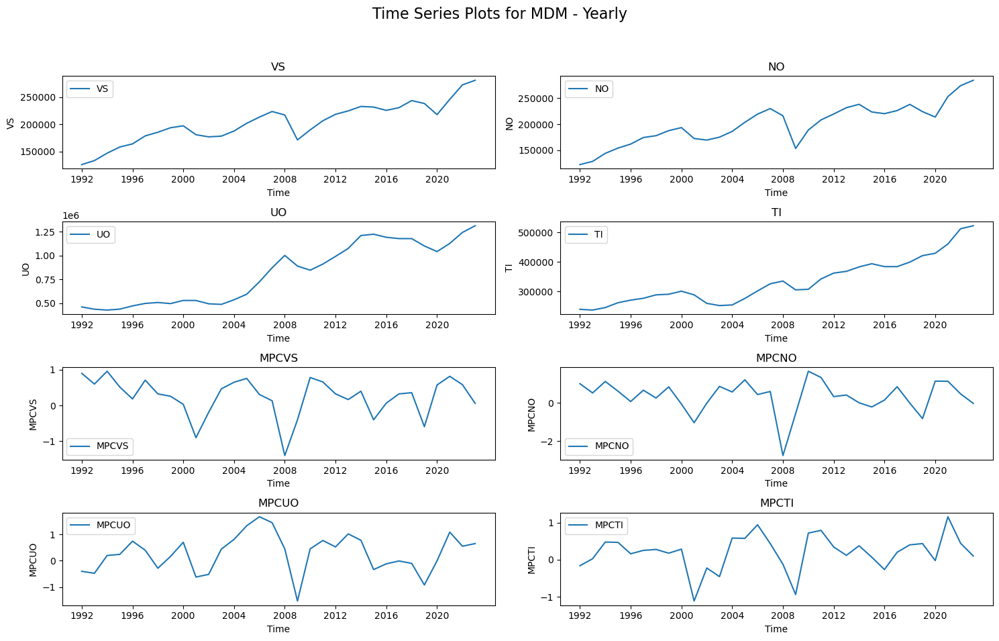

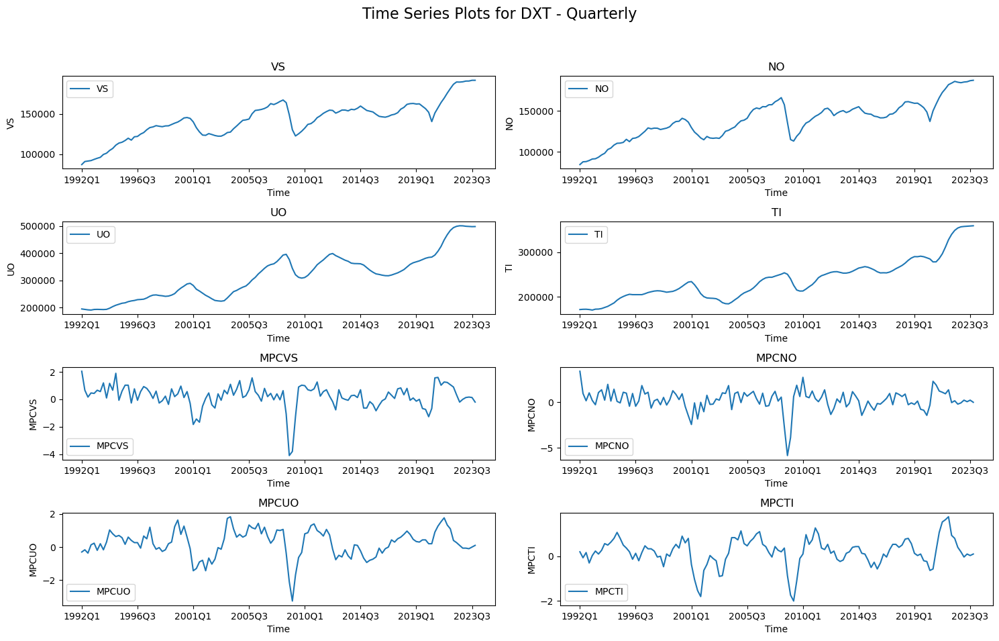

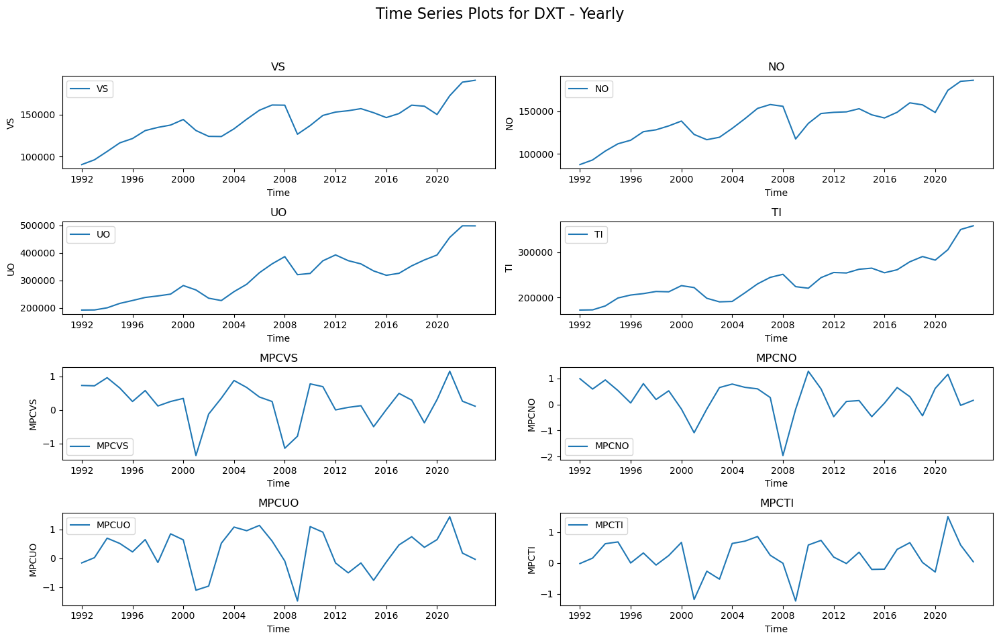

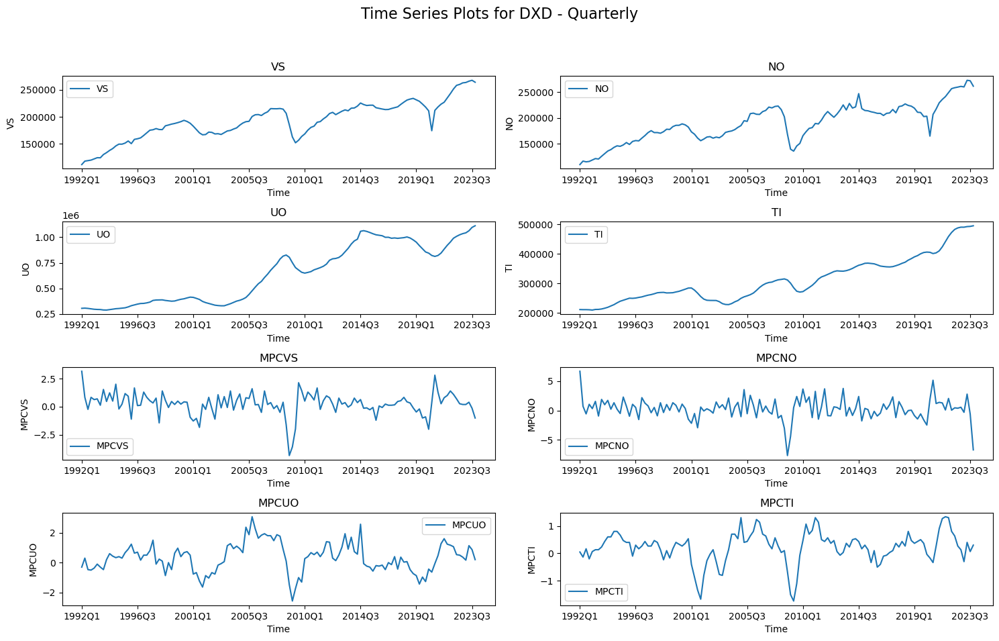

...

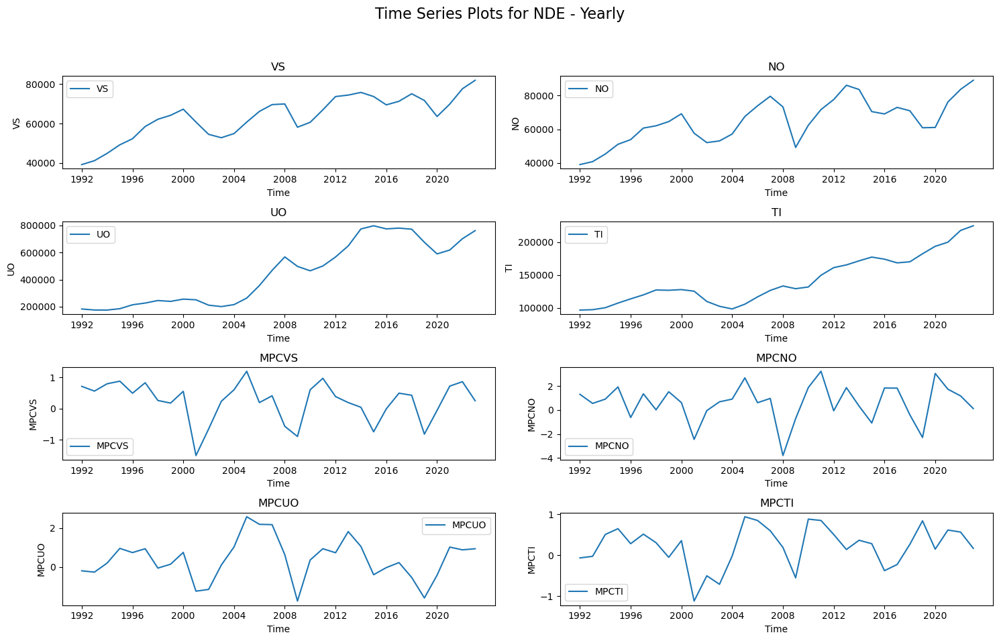

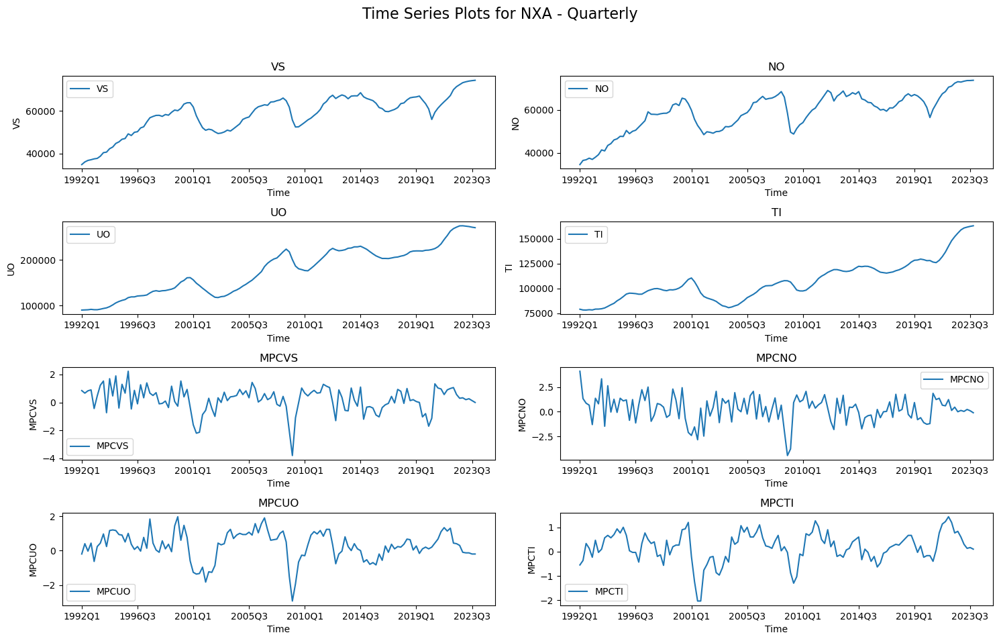

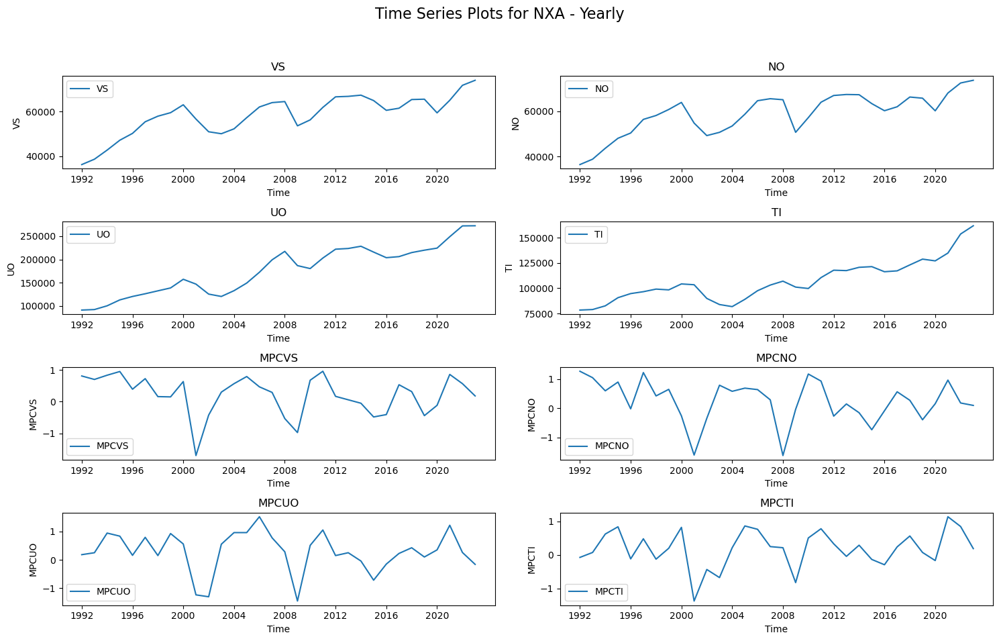

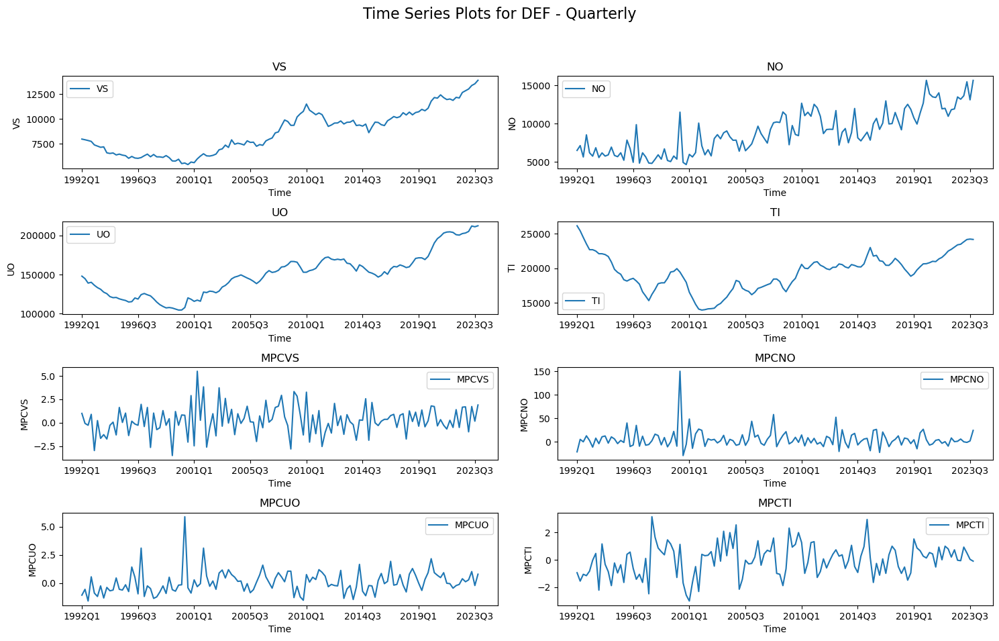

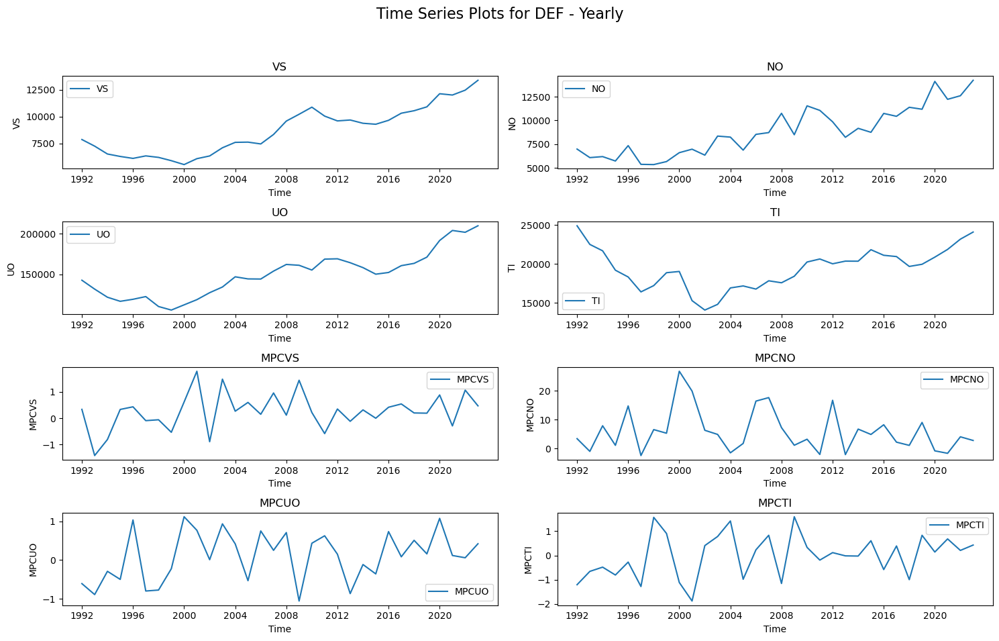

In [148]:
columns_to_plot = ['VS', 'NO', 'UO', 'TI', 'MPCVS', 'MPCNO', 'MPCUO', 'MPCTI']

categories = complete_sesonally_adj['Category'].unique()

for category in categories:
    category_data = complete_sesonally_adj[complete_sesonally_adj['Category'] == category]

    # Create quarterly plots
    plt.figure(figsize=(15, 10))
    plt.suptitle(f'Time Series Plots for {category} - Quarterly', fontsize=16)

    for i, column in enumerate(columns_to_plot, 1):
        plt.subplot(4, 2, i)
        quarterly_data = category_data.set_index('Time').resample('Q').mean()
        plt.plot(quarterly_data.index.astype(str), quarterly_data[column], label=column)
        plt.title(column)
        plt.xlabel('Time')
        plt.ylabel(column)
        plt.legend()
        num_ticks = 7
        plt.xticks(plt.xticks()[0][::len(plt.xticks()[0]) // num_ticks])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # Create yearly plots
    plt.figure(figsize=(15, 10))
    plt.suptitle(f'Time Series Plots for {category} - Yearly', fontsize=16)

    for i, column in enumerate(columns_to_plot, 1):
        plt.subplot(4, 2, i)
        yearly_data = category_data.set_index('Time').resample('Y').mean()
        plt.plot(yearly_data.index.astype(str), yearly_data[column], label=column)
        plt.title(column)
        plt.xlabel('Time')
        plt.ylabel(column)
        plt.legend()
        num_ticks = 7
        plt.xticks(plt.xticks()[0][::len(plt.xticks()[0]) // num_ticks])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


/var/folders/jy/f5jqdtb90nj9b5hg3z6rnc4r0000gn/T/ipykernel_7651/141942727.py:10: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = complete_sesonally_adj.corr()


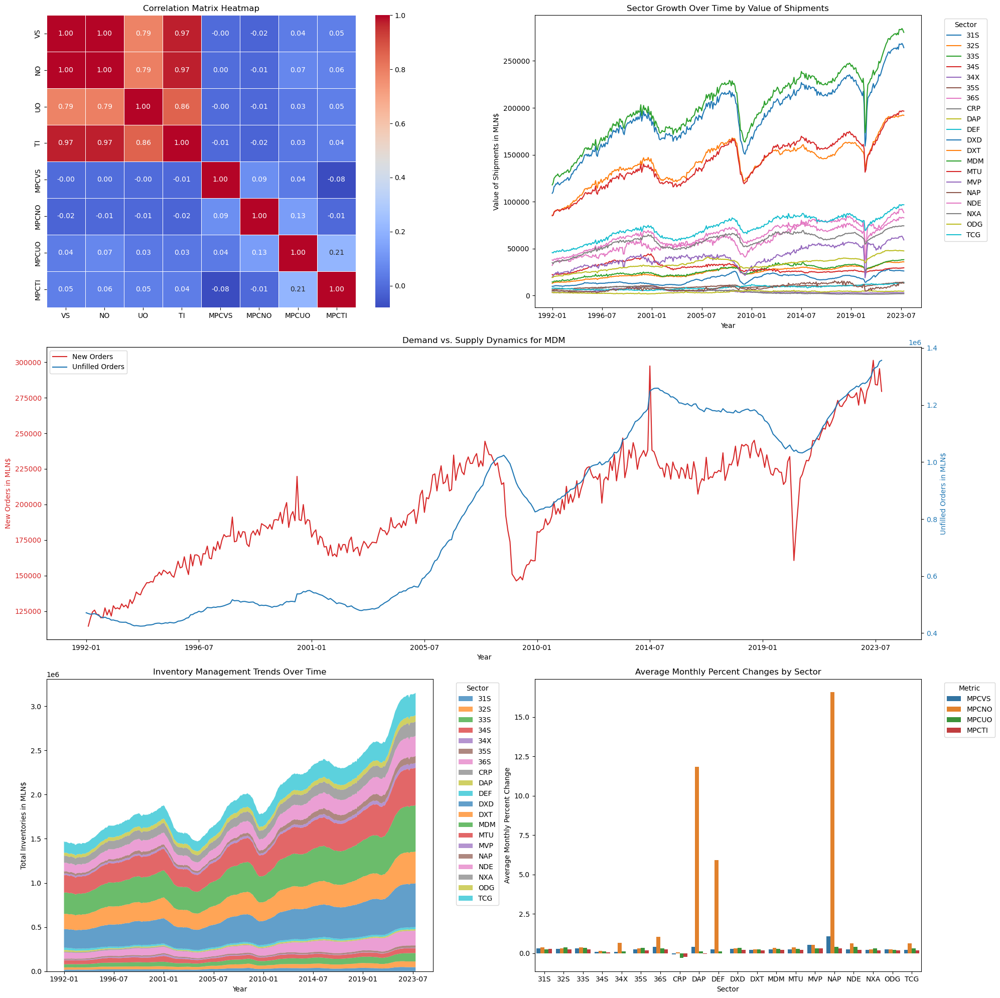

In [11]:
seasonally_adj_data = complete_sesonally_adj.copy()
sectors = np.unique(seasonally_adj_data['Category'])

# Create a new figure for the consolidated layout
fig = plt.figure(figsize=(20, 20))
gs = gridspec.GridSpec(3, 2, figure=fig)

# Correlation Matrix Heatmap
ax0 = fig.add_subplot(gs[0, 0])
correlation_matrix = complete_sesonally_adj.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, ax=ax0)
ax0.set_title('Correlation Matrix Heatmap')

# Growth Over Time by Value of Shipments
ax1 = fig.add_subplot(gs[0, 1])
for sector in sectors:
    sector_data = seasonally_adj_data[seasonally_adj_data['Category'] == sector]
    agg_data_sector = sector_data.groupby('Time')['VS'].mean()
    ax1.plot(agg_data_sector.index, agg_data_sector.values, label=sector)
ax1.set_title('Sector Growth Over Time by Value of Shipments')
ax1.set_xlabel('Year')
ax1.set_ylabel('Value of Shipments in MLN$')
ax1.set_xticks(ax1.get_xticks()[::len(ax1.get_xticks()) // num_ticks])
ax1.legend(title='Sector', bbox_to_anchor=(1.05, 1), loc='upper left')


# Demand vs. Supply Dynamics
ax2 = fig.add_subplot(gs[1, :])
selected_sectors = ['MDM']
for sector in selected_sectors:
    sector_data = seasonally_adj_data[seasonally_adj_data['Category'] == sector]
    agg_data_no = sector_data.groupby('Time')['NO'].mean()
    agg_data_uo = sector_data.groupby('Time')['UO'].mean()

    color = 'tab:red'
    ax2.set_xlabel('Year')
    ax2.set_ylabel('New Orders in MLN$', color=color)
    line1, = ax2.plot(agg_data_no.index, agg_data_no.values, color=color, label='New Orders')
    ax2.tick_params(axis='y', labelcolor=color)
    
    ax2_t = ax2.twinx()
    color = 'tab:blue'
    ax2_t.set_ylabel('Unfilled Orders in MLN$', color=color)
    line2, = ax2_t.plot(agg_data_uo.index, agg_data_uo.values, color=color, label='Unfilled Orders')
    ax2_t.tick_params(axis='y', labelcolor=color)

lines = [line1, line2]
labels = [l.get_label() for l in lines]
ax2.legend(lines, labels, loc='upper left')

ax2.set_title('Demand vs. Supply Dynamics for MDM')
ax2.set_xticks(ax2.get_xticks()[::len(ax2.get_xticks()) // num_ticks])


# Stacked Inventory Management Trends
ax3 = fig.add_subplot(gs[2, 0])
stack_data = []
for sector in sectors:
    sector_data = seasonally_adj_data[seasonally_adj_data['Category'] == sector]
    agg_data_sector_ti = sector_data.groupby('Time')['TI'].mean()
    stack_data.append(agg_data_sector_ti)
plt.stackplot(agg_data_sector_ti.index, stack_data, labels=sectors, alpha=0.7)
ax3.set_title('Inventory Management Trends Over Time')
ax3.set_xlabel('Year')
ax3.set_ylabel('Total Inventories in MLN$')
ax3.set_xticks(ax3.get_xticks()[::len(ax3.get_xticks()) // num_ticks])
ax3.legend(title='Sector', bbox_to_anchor=(1.05, 1), loc='upper left')

# Average Monthly Percent Changes by Sector
ax4 = fig.add_subplot(gs[2, 1])
avg_mpc_data = seasonally_adj_data.groupby('Category')[['MPCVS', 'MPCNO', 'MPCUO', 'MPCTI']].mean()
avg_mpc_data_reset = avg_mpc_data.reset_index()
avg_mpc_data_melted = avg_mpc_data_reset.melt(id_vars='Category', var_name='Metric', value_name='Average Change')
sns.barplot(x='Category', y='Average Change', hue='Metric', data=avg_mpc_data_melted, ax=ax4)
ax4.set_title('Average Monthly Percent Changes by Sector')
ax4.set_xlabel('Sector')
ax4.set_ylabel('Average Monthly Percent Change')
ax4.legend(title='Metric', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()
